# Classification of Pet's Faces

Lab Assignment from [AI for Beginners Curriculum](https://github.com/microsoft/ai-for-beginners).

### Getting the Data

In this assignment, we will focus on relatively simple classification task - classification of pet's faces. This dataset consists of cut-out faces from [Oxford-IIIT Dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/). Let's start by loading and visualizing the dataset.

In [50]:
!wget https://mslearntensorflowlp.blob.core.windows.net/data/petfaces.tar.gz
!tar xfz petfaces.tar.gz
!rm petfaces.tar.gz

--2024-07-09 20:23:18--  https://mslearntensorflowlp.blob.core.windows.net/data/petfaces.tar.gz
mslearntensorflowlp.blob.core.windows.net (mslearntensorflowlp.blob.core.windows.net) 해석 중... 실패: nodename nor servname provided, or not known.
wget: `mslearntensorflowlp.blob.core.windows.net' 호스트 주소를 해석할 수 없습니다
tar: Error opening archive: Failed to open 'petfaces.tar.gz'
rm: petfaces.tar.gz: No such file or directory


We will define generic function to display a series of images from a list:

In [51]:
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np

def display_images(l,titles=None,fontsize=12):
    n=len(l)
    fig,ax = plt.subplots(1,n)
    for i,im in enumerate(l):
        ax[i].imshow(im)
        ax[i].axis('off')
        if titles is not None:
            ax[i].set_title(titles[i],fontsize=fontsize)
    fig.set_size_inches(fig.get_size_inches()*n)
    plt.tight_layout()
    plt.show()

Now let's traverse all class subdirectories and plot first few images of each class:

dog_scottish_terrier


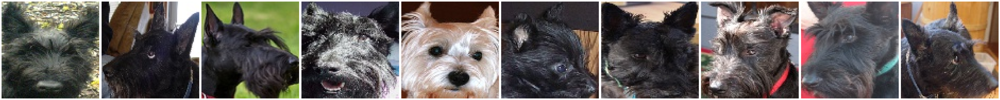

dog_english_setter


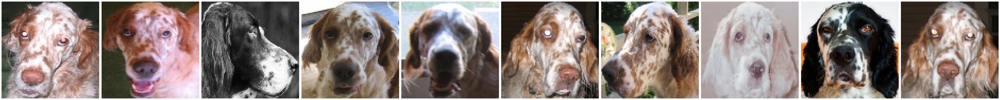

dog_beagle


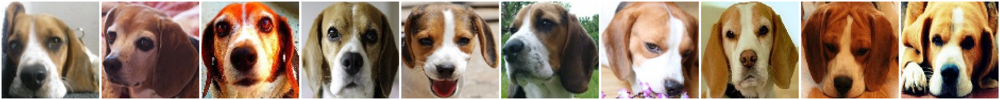

cat_Egyptian_Mau


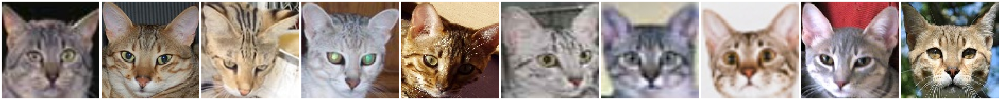

dog_yorkshire_terrier


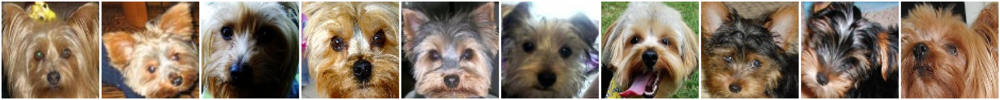

cat_Maine_Coon


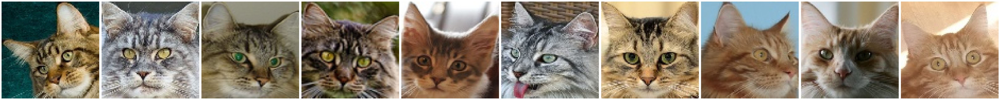

dog_japanese_chin


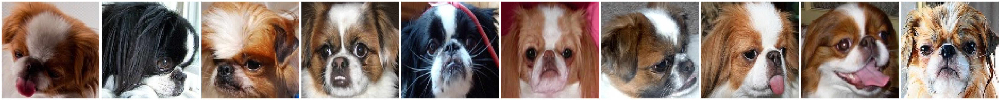

dog_saint_bernard


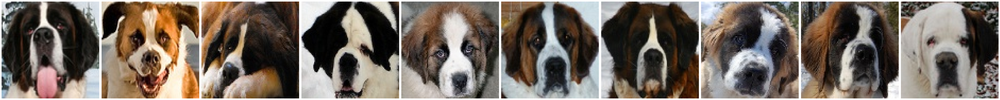

cat_Bengal


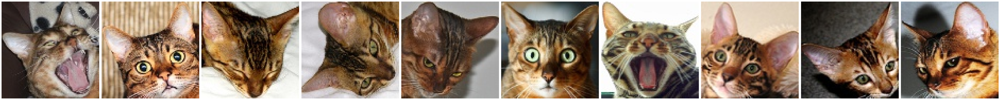

dog_shiba_inu


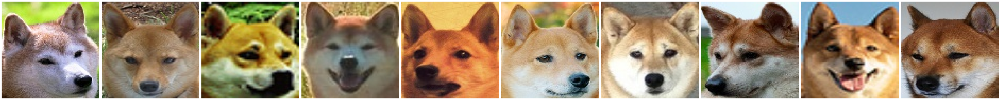

dog_keeshond


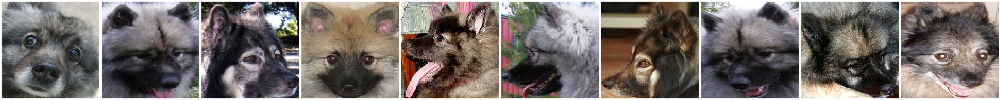

dog_pomeranian


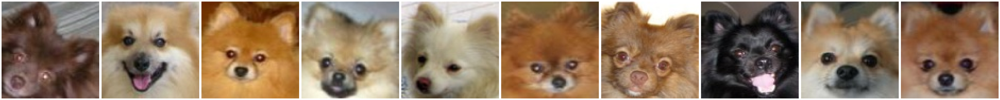

cat_Persian


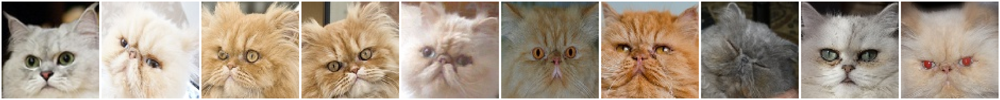

cat_Sphynx


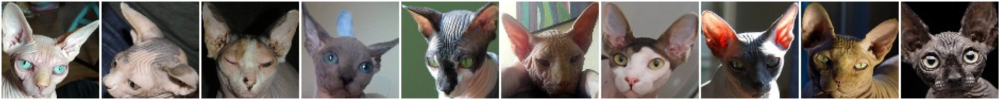

cat_Birman


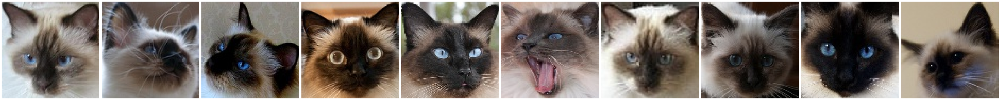

dog_american_pit_bull_terrier


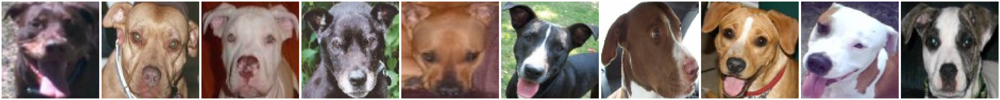

dog_samoyed


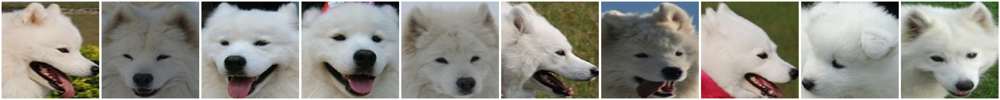

dog_chihuahua


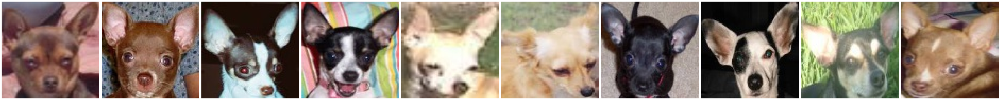

dog_havanese


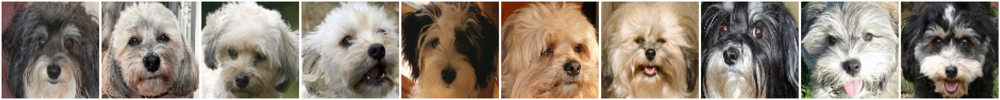

cat_Siamese


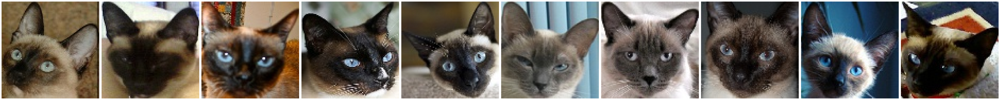

dog_leonberger


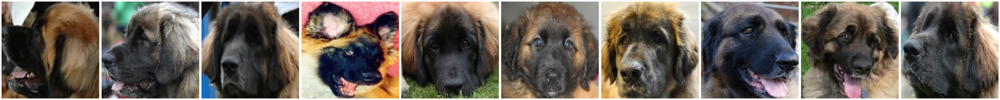

cat_Ragdoll


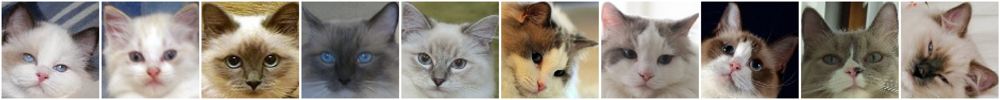

cat_Abyssinian


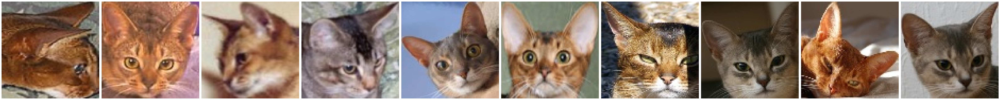

dog_staffordshire_bull_terrier


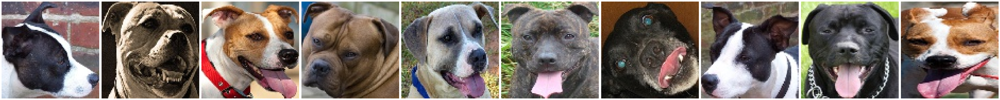

dog_american_bulldog


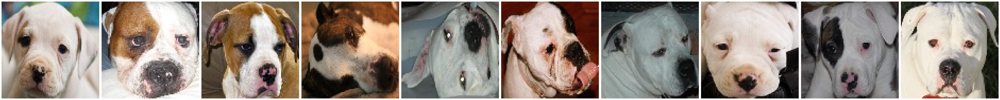

cat_British_Shorthair


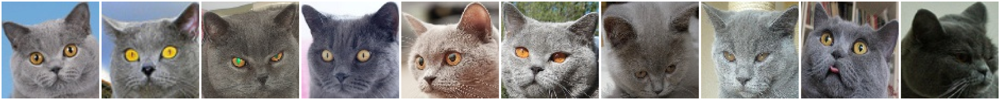

dog_newfoundland


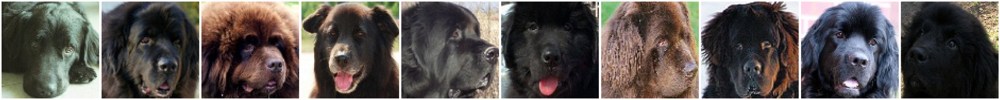

dog_german_shorthaired


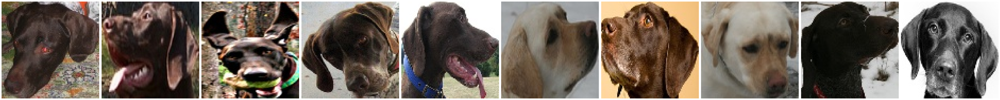

cat_Bombay


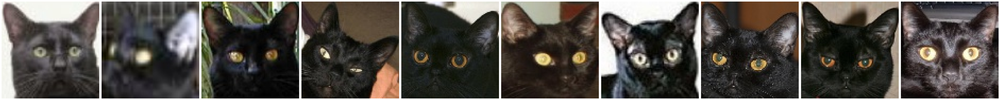

dog_wheaten_terrier


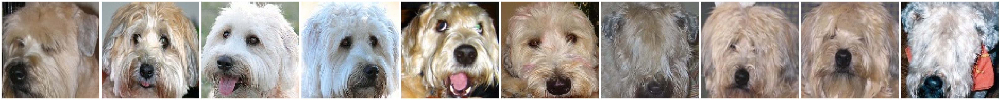

dog_pug


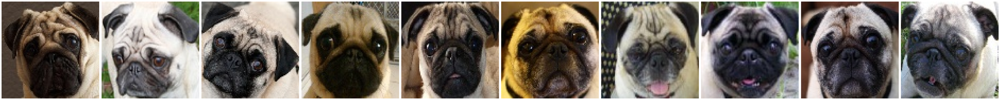

dog_basset_hound


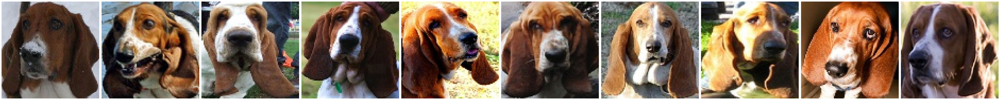

dog_english_cocker_spaniel


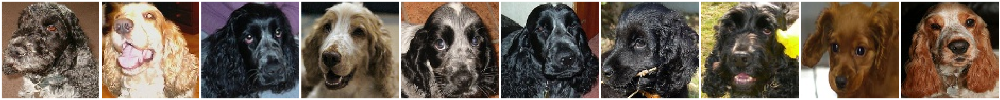

cat_Russian_Blue


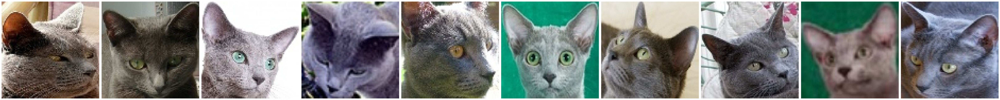

dog_miniature_pinscher


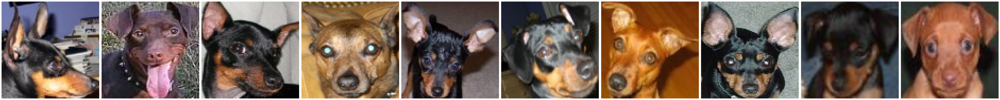

dog_great_pyrenees


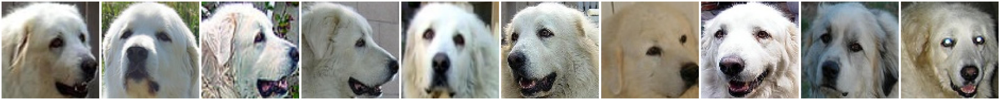

dog_boxer


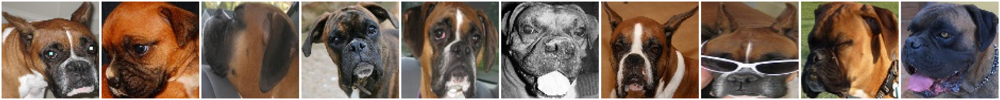

In [52]:
petfaces_dir = '../../../data/Oxford-IIIT/petfaces'

for cls in os.listdir(petfaces_dir):
    if os.path.isdir(os.path.join(petfaces_dir, cls)):
        print(cls)
        display_images([Image.open(os.path.join(petfaces_dir, cls, x)) 
                        for x in os.listdir(os.path.join(petfaces_dir, cls))[:10]])

Let's also define the number of classes in our dataset:

In [53]:
import os

# 디렉토리 개수 카운트
dir_count = sum(os.path.isdir(os.path.join(petfaces_dir, item)) for item in os.listdir(petfaces_dir))

dir_count

37

## Preparing dataset for Deep Learning

To start training our neural network, we need to convert all images to tensors, and also create tensors corresponding to labels (class numbers). Most neural network frameworks contain simple tools for dealing with images:
* In Tensorflow, use `tf.keras.preprocessing.image_dataset_from_directory`
* In PyTorch, use `torchvision.datasets.ImageFolder`

As you have seen from the pictures above, all of them are close to square image ratio, so we need to resize all images to square size. Also, we can organize images in minibatches.

In [54]:
# PyTorch의 torchvision.datasets.ImageFolder를 사용하여 데이터셋을 불러옵니다.
import torch
import torchvision
import torchvision.transforms as transforms

# 데이터셋을 불러올 때 사용할 변환을 정의합니다.
transform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# petfaces_dir은 다음과 같은 구조를 같습니다.
# petfaces_dir / class1 / image1.jpg
# petfaces_dir / class1 / image2.jpg
# ...
# petfaces_dir / class2 / image1.jpg
# petfaces_dir / class2 / image2.jpg
# ...
# 이 구조를 이용하여 ImageFolder를 사용하여 데이터셋을 불러옵니다.
dataset = torchvision.datasets.ImageFolder(petfaces_dir, transform=transform)



Now we need to separate dataset into train and test portions:

In [55]:
# CODE TO DO TRAIN/TEST SPLIT
# 데이터셋을 훈련셋과 검증셋으로 나눕니다.
from torch.utils.data import random_split

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

print(train_size, val_size)


2948 738


Now let's print the size of tensors in our dataset. If you have done everything correctly, the size of training elements should be
 * `(batch_size,image_size,image_size,3)` for Tensorflow, `batch_size,3,image_size,image_size` for PyTorch
 * `batch_size` for Labels
 
 Labels should contain numbers of classes.

In [56]:
# Print tensor sizes
# 데이터로더를 생성합니다.
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)

# 데이터셋의 클래스 이름을 확인합니다.
print(dataset.classes)

# Now let's print the size of tensors in our dataset. If you have done everything correctly, the size of training elements should be
# [batch_size, 3, 32, 32] and the size of labels should be [batch_size].
for images, labels in train_loader:
    print(images.size(), labels.size())
    # break

['cat_Abyssinian', 'cat_Bengal', 'cat_Birman', 'cat_Bombay', 'cat_British_Shorthair', 'cat_Egyptian_Mau', 'cat_Maine_Coon', 'cat_Persian', 'cat_Ragdoll', 'cat_Russian_Blue', 'cat_Siamese', 'cat_Sphynx', 'dog_american_bulldog', 'dog_american_pit_bull_terrier', 'dog_basset_hound', 'dog_beagle', 'dog_boxer', 'dog_chihuahua', 'dog_english_cocker_spaniel', 'dog_english_setter', 'dog_german_shorthaired', 'dog_great_pyrenees', 'dog_havanese', 'dog_japanese_chin', 'dog_keeshond', 'dog_leonberger', 'dog_miniature_pinscher', 'dog_newfoundland', 'dog_pomeranian', 'dog_pug', 'dog_saint_bernard', 'dog_samoyed', 'dog_scottish_terrier', 'dog_shiba_inu', 'dog_staffordshire_bull_terrier', 'dog_wheaten_terrier', 'dog_yorkshire_terrier']
torch.Size([64, 3, 32, 32]) torch.Size([64])
torch.Size([64, 3, 32, 32]) torch.Size([64])
torch.Size([64, 3, 32, 32]) torch.Size([64])
torch.Size([64, 3, 32, 32]) torch.Size([64])
torch.Size([64, 3, 32, 32]) torch.Size([64])
torch.Size([64, 3, 32, 32]) torch.Size([64])
t

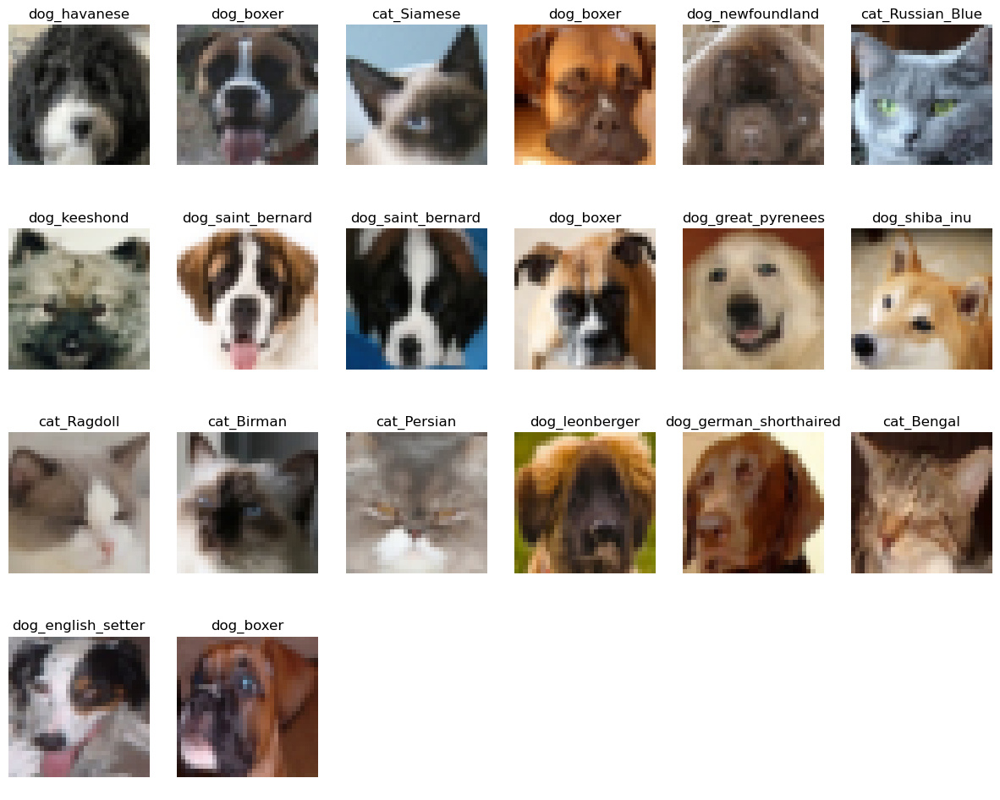

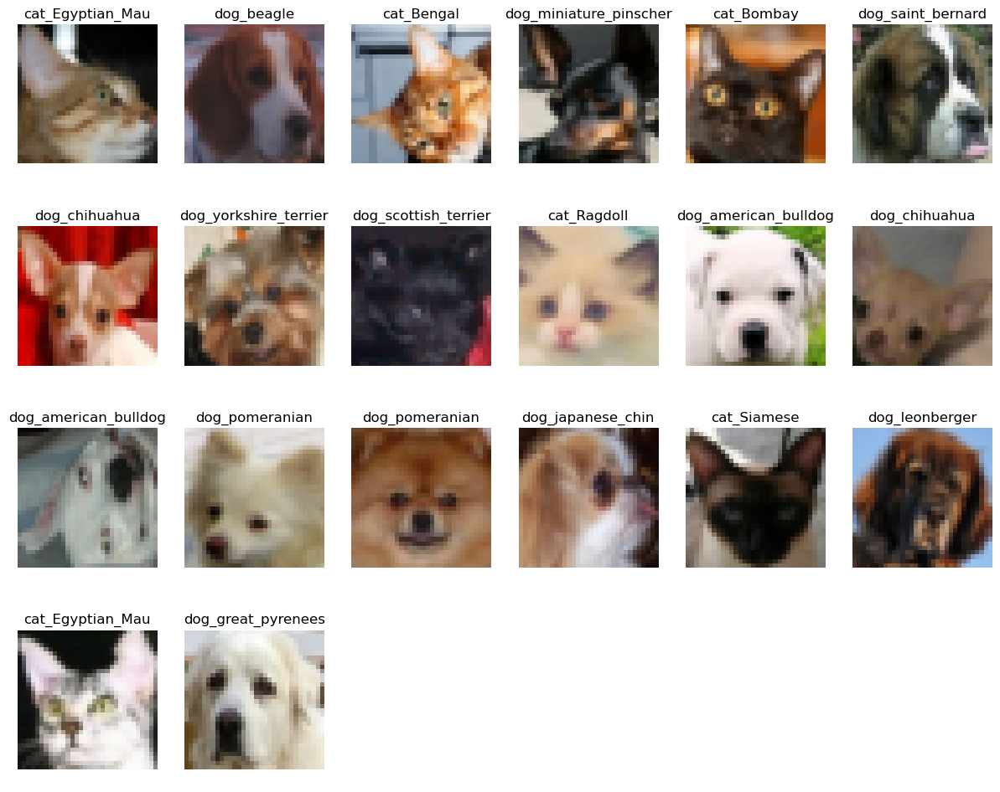

In [57]:
# Display the data
# 이미지를 출력합니다.
def display_dataloader(dataloader, n=10, classes=None, images_per_row=10):
    data_iter = iter(dataloader)
    
    # 데이터를 하나의 배치만 가져온다
    images, labels = next(data_iter)
    
    # n이 배치 크기보다 클 수 있으므로 조정
    n = min(n, len(images))
    
    mn = images[:n].min()
    mx = images[:n].max()
    
    # 전체 이미지 수에 따라 행과 열 계산
    rows = (n + images_per_row - 1) // images_per_row
    fig, ax = plt.subplots(rows, images_per_row, figsize=(15, 3 * rows))
    ax = ax.flatten()
    
    for i in range(n):
        img = images[i]
        label = labels[i].item() if labels[i].numel() == 1 else labels[i]
        img = (img - mn) / (mx - mn)
        img = img.permute(1, 2, 0).numpy()  # (C, H, W) -> (H, W, C)
        
        ax[i].imshow(img)
        ax[i].axis('off')
        if classes:
            ax[i].set_title(classes[label])
    
    # 나머지 subplot 숨기기
    for j in range(n, len(ax)):
        ax[j].axis('off')
        

display_dataloader(train_loader, n=20, classes=dataset.classes, images_per_row=6)
display_dataloader(val_loader, n=20, classes=dataset.classes, images_per_row=6)

## Define a neural network

For image classification, you should probably define a convolutional neural network with several layers. What to keep an eye for:
* Keep in mind the pyramid architecture, i.e. number of filters should increase as you go deeper
* Do not forget activation functions between layers (ReLU) and Max Pooling
* Final classifier can be with or without hidden layers, but the number of output neurons should be equal to number of classes.

An important thing is to get the activation function on the last layer + loss function right:
* In Tensorflow, you can use `softmax` as the activation, and `sparse_categorical_crossentropy` as loss. The difference between sparse categorical cross-entropy and non-sparse one is that the former expects output as the number of class, and not as one-hot vector.
* In PyTorch, you can have the final layer without activation function, and use `CrossEntropyLoss` loss function. This function applies softmax automatically. 

In [58]:
# CODE TO DEFINE NEURAL NETWORK
# 신경망을 정의합니다.
import torch.nn as nn
import torch.nn.functional as F
from torchinfo import summary

# 데이터셋의 클래스 개수를 확인합니다.
num_classes = len(dataset.classes)
num_classes

#
# GPT가 생성한 모델이다.
#
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # 3: 입력 이미지의 채널 수, 6: 첫 번째 층의 출력 채널 수, 5: 커널 크기
        self.conv1 = nn.Conv2d(3, 6, 5)
        # 2: 풀링 윈도우 크기
        self.pool = nn.MaxPool2d(2, 2)
        # 6: 첫 번째 층의 출력 채널 수, 16: 두 번째 층의 출력 채널 수, 5: 커널 크기
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, num_classes)

    def forward(self, x):
        # conv1: 3 x 32 x 32 -> 6 x 28 x 28 -> 6 x 14 x 14 (params: 456 = 6 * (3 * 5 * 5 + 1))
        x = self.pool(F.relu(self.conv1(x)))
        # conv2: 6 x 14 x 14 -> 16 x 10 x 10 -> 16 x 5 x 5 (params: 2416 = 16 * (6 * 5 * 5 + 1))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 16 * 5 * 5)
        # fc1: 16 x 5 x 5 -> 120 (params: 48120 = 16 * 5 * 5 * 120 + 120)
        x = F.relu(self.fc1(x))
        # fc2: 120 -> 84 (params: 10164 = 120 * 84 + 84)
        x = F.relu(self.fc2(x))
        # fc3: 84 -> num_classes (params: 2130 = 84 * num_classes + num_classes)
        x = self.fc3(x)
        return x
    
net = Net()

summary(net, input_size=(1, 3, 32, 32))

Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [1, 6, 28, 28]            456
├─MaxPool2d: 1-2                         [1, 6, 14, 14]            --
├─Conv2d: 1-3                            [1, 16, 10, 10]           2,416
├─MaxPool2d: 1-4                         [1, 16, 5, 5]             --
├─Linear: 1-5                            [1, 120]                  48,120
├─Linear: 1-6                            [1, 84]                   10,164
├─Linear: 1-7                            [1, 37]                   3,145
Total params: 64,301
Trainable params: 64,301
Non-trainable params: 0
Total mult-adds (M): 0.65
Input size (MB): 0.01
Forward/backward pass size (MB): 0.05
Params size (MB): 0.26
Estimated Total Size (MB): 0.32

In [64]:
# ConvNetsPyTorch.ipynb에서 가져왔다.
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.conv3 = nn.Conv2d(16,120,5)
        self.flat = nn.Flatten()
        self.fc1 = nn.Linear(120,64)
        self.fc2 = nn.Linear(64,num_classes)

    def forward(self, x):
        # conv1: 3 x 32 x 32 -> 6 x 28 x 28 (params: 456 = 6 x 3 x 5 x 5 + 6)
        # pool: 6 x 28 x 28 -> 6 x 14 x 14 (params: 0) 
        x = self.pool(nn.functional.relu(self.conv1(x)))
        # conv2: 6 x 14 x 14 -> 16 x 10 x 10 (params: 2416 = 16 x 6 x 5 x 5 + 16)
        # pool: 16 x 10 x 10 -> 16 x 5 x 5 (params: 0)
        x = self.pool(nn.functional.relu(self.conv2(x)))
        # conv3: 16 x 5 x 5 -> 120 x 1 x 1 (params: 48120 = 120 x 16 x 5 x 5 + 120)
        # relu: 120 x 1 x 1 -> 120 x 1 x 1 (params: 0)
        x = nn.functional.relu(self.conv3(x))
        # flat: 120 x 1 x 1 -> 120 (params: 0)
        x = self.flat(x)
        # fc1: 120 -> 64 (params: 7744 = 120 x 64 + 64)
        # relu: 64 -> 64 (params: 0)
        x = nn.functional.relu(self.fc1(x))
        # fc2: 64 -> 10 (params: 650 = 64 x 10 + 10)
        x = self.fc2(x)
        return x

net = LeNet()

summary(net,input_size=(1,3,32,32))

Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [1, 6, 28, 28]            456
├─MaxPool2d: 1-2                         [1, 6, 14, 14]            --
├─Conv2d: 1-3                            [1, 16, 10, 10]           2,416
├─MaxPool2d: 1-4                         [1, 16, 5, 5]             --
├─Conv2d: 1-5                            [1, 120, 1, 1]            48,120
├─Flatten: 1-6                           [1, 120]                  --
├─Linear: 1-7                            [1, 64]                   7,744
├─Linear: 1-8                            [1, 37]                   2,405
Total params: 61,141
Trainable params: 61,141
Non-trainable params: 0
Total mult-adds (M): 0.65
Input size (MB): 0.01
Forward/backward pass size (MB): 0.05
Params size (MB): 0.24
Estimated Total Size (MB): 0.31

In [67]:
#
# GPT가 생성한 모델이다.
#
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=35):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.dropout = nn.Dropout(p=0.5)
        self.fc1 = nn.Linear(128 * 4 * 4, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 128 * 4 * 4)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

net = SimpleCNN(num_classes=num_classes)
summary(net,input_size=(1,3,32,32))

Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [1, 32, 32, 32]           896
├─MaxPool2d: 1-2                         [1, 32, 16, 16]           --
├─Conv2d: 1-3                            [1, 64, 16, 16]           18,496
├─MaxPool2d: 1-4                         [1, 64, 8, 8]             --
├─Conv2d: 1-5                            [1, 128, 8, 8]            73,856
├─MaxPool2d: 1-6                         [1, 128, 4, 4]            --
├─Linear: 1-7                            [1, 256]                  524,544
├─Dropout: 1-8                           [1, 256]                  --
├─Linear: 1-9                            [1, 37]                   9,509
Total params: 627,301
Trainable params: 627,301
Non-trainable params: 0
Total mult-adds (M): 10.86
Input size (MB): 0.01
Forward/backward pass size (MB): 0.46
Params size (MB): 2.51
Estimated Total Size (MB): 2.98

## Train the Neural Network

Now we are ready to train the neural network. During training, please collect accuracy on train and test data on each epoch, and then plot the accuracy to see if there is overfitting.

> To speed up training, you need to use GPU if available. While TensorFlow/Keras will automatically use GPU, in PyTorch you need to move both the model and data to GPU during training using `.to()` method in order to take advantage of GPU acceleration. 


In [69]:
import sys
import os

# 부모 디렉토리를 sys.path에 추가
parent_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
sys.path.insert(0, parent_dir)

# pytorchcv.py 파일이 부모 디렉토리에 있다.
from pytorchcv import train, plot_results, display_dataset

# TRAIN THE NETWORK
# opt = torch.optim.SGD(net.parameters(),lr=0.02,momentum=0.9)
opt = torch.optim.Adam(net.parameters(), lr=0.001)
hist = train(net, train_loader, val_loader, epochs=10, optimizer=opt, loss_fn=nn.CrossEntropyLoss())


Epoch  0, Train acc=0.888, Val acc=0.554, Train loss=0.005, Val loss=0.036
Epoch  1, Train acc=0.919, Val acc=0.556, Train loss=0.004, Val loss=0.037
Epoch  2, Train acc=0.941, Val acc=0.558, Train loss=0.003, Val loss=0.038
Epoch  3, Train acc=0.931, Val acc=0.546, Train loss=0.003, Val loss=0.038
Epoch  4, Train acc=0.948, Val acc=0.547, Train loss=0.003, Val loss=0.039
Epoch  5, Train acc=0.959, Val acc=0.558, Train loss=0.002, Val loss=0.041
Epoch  6, Train acc=0.962, Val acc=0.549, Train loss=0.002, Val loss=0.040
Epoch  7, Train acc=0.961, Val acc=0.562, Train loss=0.002, Val loss=0.041
Epoch  8, Train acc=0.967, Val acc=0.570, Train loss=0.002, Val loss=0.041
Epoch  9, Train acc=0.972, Val acc=0.565, Train loss=0.002, Val loss=0.042
Epoch 10, Train acc=0.968, Val acc=0.551, Train loss=0.002, Val loss=0.041
Epoch 11, Train acc=0.968, Val acc=0.553, Train loss=0.002, Val loss=0.041
Epoch 12, Train acc=0.964, Val acc=0.543, Train loss=0.002, Val loss=0.041
Epoch 13, Train acc=0.975

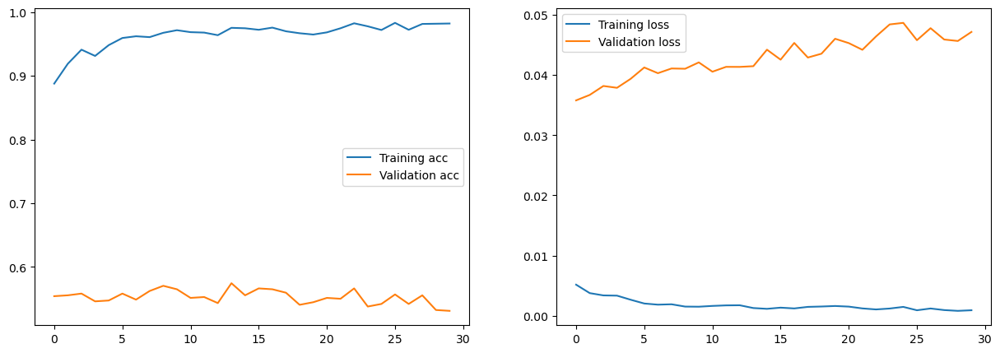

In [70]:
# PLOT THE ACCURACY on train and validation dataset
plot_results(hist)

What can you say about overfitting? What can be done to improve the accuracy of the model

## Optional: Calculate Top3 Accuracy

In this exercise, we were dealing with classification with quite high number of classes (35), so our result - around 50% validation accuracy - is pretty good. Standard ImageNet dataset has even more - 1000 classes.

In such cases it is difficult to ensure that model **always** correctly predicts the class. There are cases when two breeds are very similar to each other, and the model returns very similar probablities (eg., 0.45 and 0.43). If we measure standard accuracy, it will be considered a wrong case, even though the model did very small mistake. This, we often measure another metric - an accuracy within top 3 most probable predictions of the model.

We consider the case accurate if target label is contained within top 3 model predictions. 

To compute top-3 accuracy on the test dataset, you need to manually go over the dataset, apply the neural network to get the prediction, and then do the calculations. Some hints:

* In Tensorflow, use `tf.nn.in_top_k` function to see if the `predictions` (output of the model) are in top-k (pass `k=3` as parameter), with respect to `targets`. This function returns a tensor of boolean values, which can be converted to `int` using `tf.cast`, and then accumulated using `tf.reduce_sum`.
* In PyTorch, you can use `torch.topk` function to get indices of classes with highers probabilities, and then see if the correct class belongs to them. See [this](https://gist.github.com/weiaicunzai/2a5ae6eac6712c70bde0630f3e76b77b) for more hints.


In [3]:
# CALCULATE TOP-3 ACCURACY

## Optional: Build Cats vs. Dogs classification

We also want to see how accurate our binary cats vs. dogs classification would be on the same dateset. To do it, we need to adjust labels:

2948 738
torch.Size([64, 3, 32, 32]) torch.Size([64])


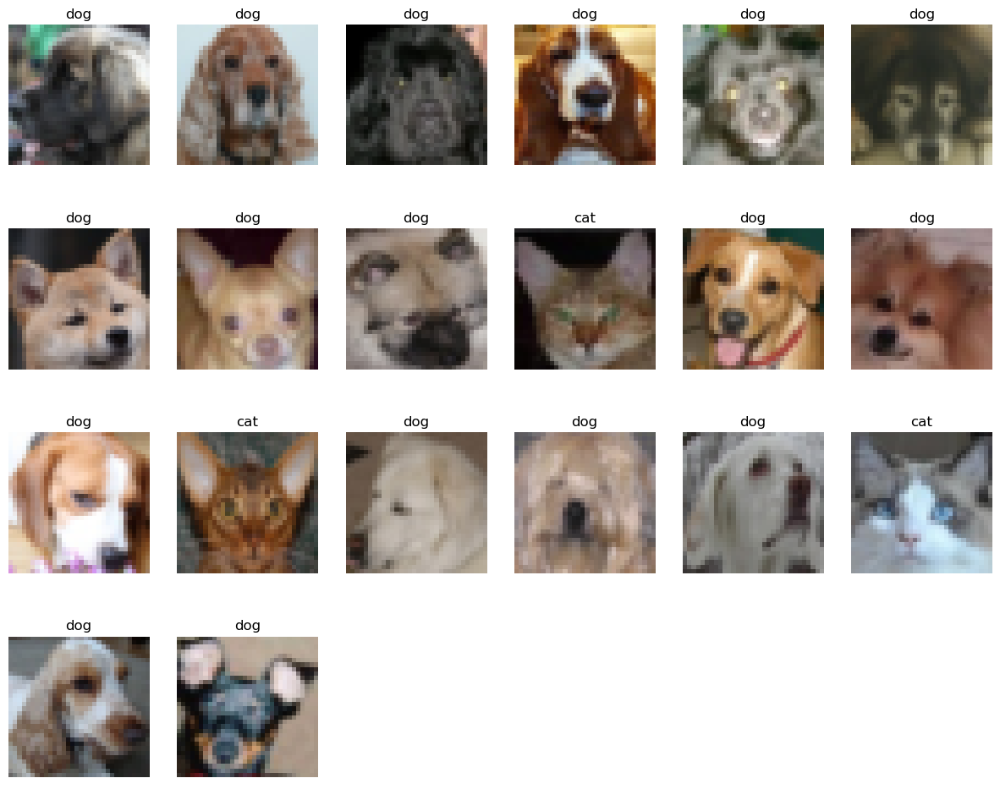

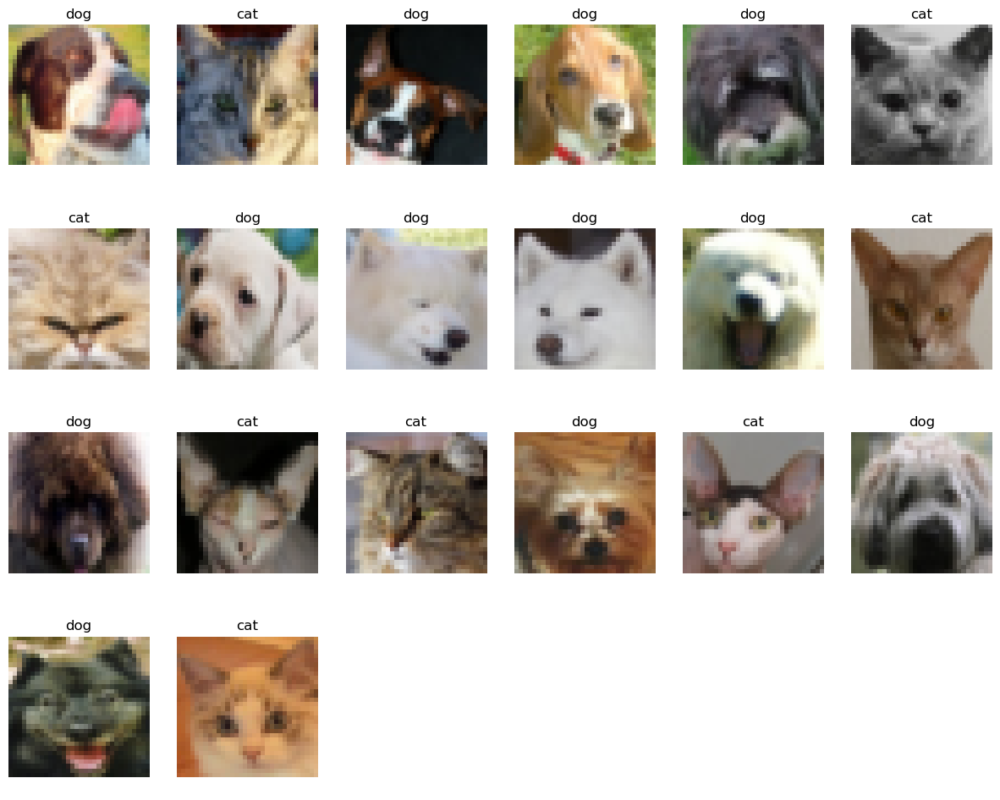

In [78]:
# Define dataset that contains only two labels: 0 = cat, 1 = dog
# Hint: use class name prefix to figure out which one is which

#
# 기존 dataset으로부터 custom_dataset을 생성한다.
#

# 레이블 변환 함수
def target_transform(target):
    class_name = dataset.classes[target]
    if class_name.startswith('cat_'):
        return 0  # cat class
    elif class_name.startswith('dog_'):
        return 1  # dog class
    else:
        raise ValueError(f"Unexpected class name: {class_name}")

# 레이블을 변환하는 새 데이터셋
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, target_transform=None):
        self.dataset = dataset
        self.target_transform = target_transform
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        img, target = self.dataset[idx]
        if self.target_transform:
            target = self.target_transform(target)
        return img, target

custom_dataset = CustomDataset(dataset, target_transform=target_transform)
# 클래스 이름 설정
custom_dataset.classes = ['cat', 'dog']

train_size = int(0.8 * len(custom_dataset))
val_size = len(custom_dataset) - train_size

train_dataset, val_dataset = random_split(custom_dataset, [train_size, val_size])

print(train_size, val_size)

# Print tensor sizes
# 데이터로더를 생성합니다.
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)

# Now let's print the size of tensors in our dataset. If you have done everything correctly, the size of training elements should be
# [batch_size, 3, 32, 32] and the size of labels should be [batch_size].
for images, labels in train_loader:
    print(images.size(), labels.size())
    break

display_dataloader(train_loader, n=20, classes=custom_dataset.classes, images_per_row=6)
display_dataloader(val_loader, n=20, classes=custom_dataset.classes, images_per_row=6)

In [79]:
# Define neural network architecture and train
net = SimpleCNN(num_classes=2)
summary(net,input_size=(1,3,32,32))

opt = torch.optim.Adam(net.parameters(), lr=0.001)
hist = train(net, train_loader, val_loader, epochs=10, optimizer=opt, loss_fn=nn.CrossEntropyLoss())

Epoch  0, Train acc=0.677, Val acc=0.713, Train loss=0.009, Val loss=0.009
Epoch  1, Train acc=0.819, Val acc=0.846, Train loss=0.006, Val loss=0.006
Epoch  2, Train acc=0.874, Val acc=0.870, Train loss=0.005, Val loss=0.005
Epoch  3, Train acc=0.909, Val acc=0.897, Train loss=0.004, Val loss=0.004
Epoch  4, Train acc=0.925, Val acc=0.924, Train loss=0.003, Val loss=0.003
Epoch  5, Train acc=0.944, Val acc=0.931, Train loss=0.002, Val loss=0.003
Epoch  6, Train acc=0.962, Val acc=0.920, Train loss=0.002, Val loss=0.004
Epoch  7, Train acc=0.963, Val acc=0.935, Train loss=0.001, Val loss=0.003
Epoch  8, Train acc=0.980, Val acc=0.931, Train loss=0.001, Val loss=0.004
Epoch  9, Train acc=0.986, Val acc=0.917, Train loss=0.001, Val loss=0.005


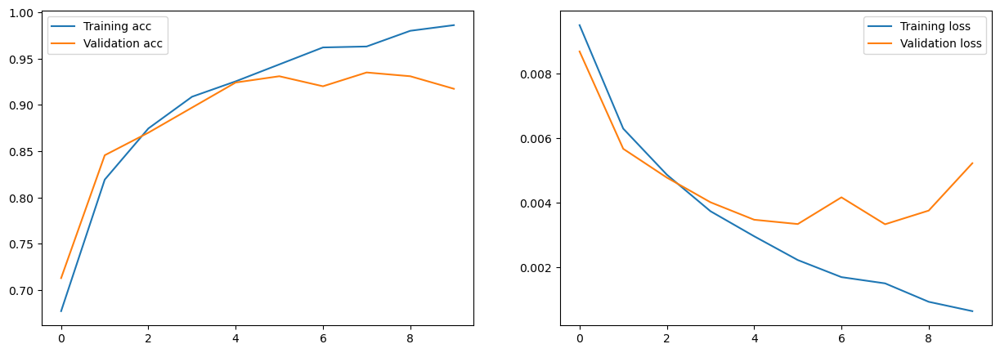

In [80]:
plot_results(hist)